In [1]:
# While not an explicit exercise in the book, in this notebook I am testing out importing a model via Torch Hub
import torch
from torch import hub

In [2]:
resnet152_model = hub.load('pytorch/vision:master', 'resnet152', pretrained=True)

Downloading: "https://github.com/pytorch/vision/archive/master.zip" to /Users/matthewleinhauser/.cache/torch/hub/master.zip
Downloading: "https://download.pytorch.org/models/resnet152-394f9c45.pth" to /Users/matthewleinhauser/.cache/torch/hub/checkpoints/resnet152-394f9c45.pth


  0%|          | 0.00/230M [00:00<?, ?B/s]

In [3]:
resnet152_model

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [5]:
from torchvision import transforms

preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(
    mean=[0.485, 0.456, 0.406],
    std=[0.229, 0.224, 0.225])
])

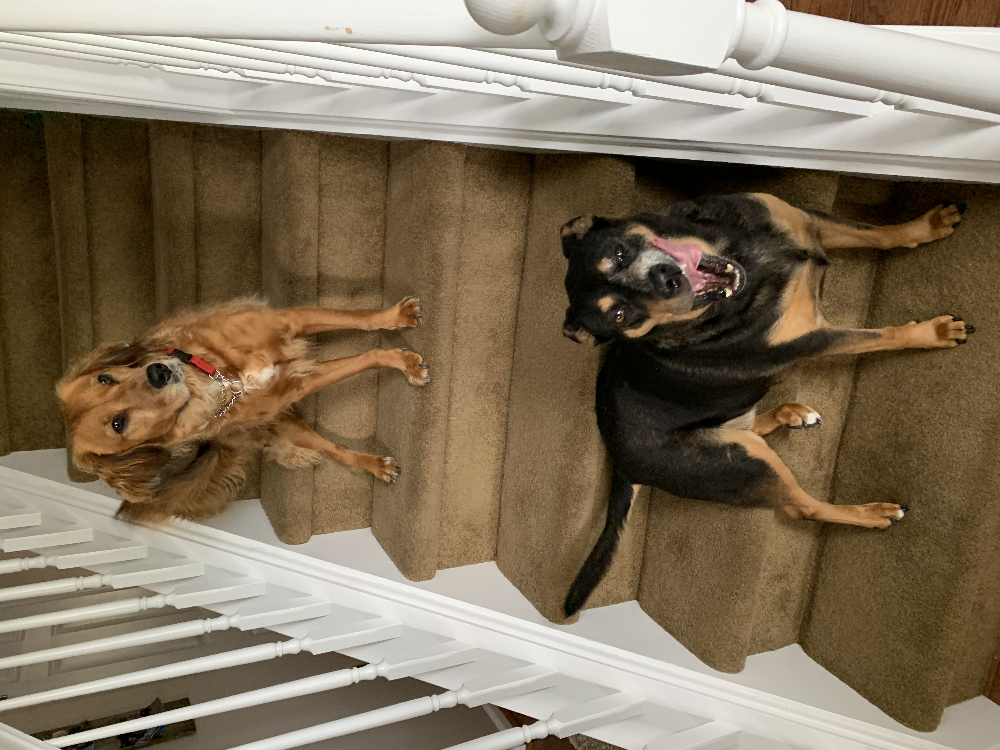

In [6]:
from PIL import Image
img = Image.open("../images/reggie_and_ramsey.jpg")
img

In [7]:
img_t = preprocess(img)

In [8]:
batch_t = torch.unsqueeze(img_t, 0)

In [9]:
resnet152_model.eval()

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [10]:
out = resnet152_model(batch_t)
out

tensor([[-2.8579e+00, -2.9031e+00, -1.6296e+00, -3.0562e+00, -1.4158e+00,
          8.4166e-01, -3.5656e+00,  1.7522e+00,  1.4091e+00, -5.1334e-01,
         -4.1938e+00, -4.9125e+00, -3.1364e+00, -3.4384e+00, -4.8271e+00,
         -3.4794e-01, -3.3720e+00, -9.0136e-01, -2.9705e+00, -3.7526e+00,
         -6.2169e+00, -1.2871e-01, -4.3862e+00,  1.1597e+00, -2.7394e+00,
          1.1637e+00, -1.5068e+00, -4.1635e+00, -1.5685e+00, -2.4251e+00,
         -3.8382e-01,  3.0970e-01,  1.1041e+00,  2.1237e+00,  1.9728e-01,
          9.7790e-01,  1.5482e+00,  3.8932e+00, -1.0722e+00, -3.7188e-01,
         -5.4750e+00, -2.8524e+00, -2.0481e+00, -1.7670e+00, -3.6132e+00,
         -8.4467e-01, -3.0197e+00, -1.8475e+00, -3.3930e+00, -3.1217e+00,
         -2.4161e+00,  4.5330e+00, -2.7454e+00, -1.0087e+00, -4.9605e-01,
         -2.7367e+00, -4.7955e+00, -1.7283e+00, -1.9831e+00, -2.3717e+00,
         -1.3574e+00, -2.5684e+00, -2.3942e+00, -5.0597e-01, -1.2528e+00,
         -2.4793e+00, -1.0401e+00, -8.

In [11]:
with open("imagenet_classes.txt") as f:
    labels = [line.strip() for line in f.readlines()]

In [12]:
_, index = torch.max(out, 1)

In [13]:
percentage = torch.nn.functional.softmax(out, dim=1)[0] * 100
labels[index[0]], percentage[index[0]].item()

('Rottweiler', 35.173255920410156)

In [14]:
_, indices = torch.sort(out, descending=True)
[(labels[idx], percentage[idx].item()) for idx in indices[0][:5]]

[('Rottweiler', 35.173255920410156),
 ('muzzle', 28.241058349609375),
 ('miniature pinscher', 21.162328720092773),
 ('Brabancon griffon', 5.767213821411133),
 ('Chihuahua', 2.6991772651672363)]